In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
!ls "/content/drive/My Drive"

'Colab Notebooks'  'Training Batch 1'


In [3]:
from keras.layers import Input, Conv2D, MaxPooling2D, concatenate, Conv2DTranspose, Dropout
from keras.models import Model
from tensorflow.keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras import regularizers
from keras.layers import *
from keras.callbacks import ModelCheckpoint, TensorBoard
from keras.models import model_from_json

import keras.backend as K
import tensorflow as tf
import nibabel as nib
from glob import glob
import matplotlib.pyplot as plt
import numpy as np
from random import shuffle
import os
from nibabel.testing import data_path
import zipfile
import io


Datapath='/content/drive/My Drive/Training Batch 1'
imgdata=[]

img_path = sorted(glob(Datapath+"/volume-*.nii"))
mask_path = sorted(glob(Datapath+"/segmentation-*.nii"))

print(img_path)
print(mask_path)

print("Number of images :", len(img_path))


patch_ratio = []

for i in range(6+ 1):
  patch_ratio.append(32 * i)

print(patch_ratio)

['/content/drive/My Drive/Training Batch 1/volume-0.nii', '/content/drive/My Drive/Training Batch 1/volume-1.nii', '/content/drive/My Drive/Training Batch 1/volume-10.nii', '/content/drive/My Drive/Training Batch 1/volume-11.nii', '/content/drive/My Drive/Training Batch 1/volume-12.nii', '/content/drive/My Drive/Training Batch 1/volume-13.nii', '/content/drive/My Drive/Training Batch 1/volume-14.nii', '/content/drive/My Drive/Training Batch 1/volume-15.nii', '/content/drive/My Drive/Training Batch 1/volume-16.nii', '/content/drive/My Drive/Training Batch 1/volume-17.nii', '/content/drive/My Drive/Training Batch 1/volume-18.nii', '/content/drive/My Drive/Training Batch 1/volume-19.nii', '/content/drive/My Drive/Training Batch 1/volume-2.nii', '/content/drive/My Drive/Training Batch 1/volume-20.nii', '/content/drive/My Drive/Training Batch 1/volume-21.nii', '/content/drive/My Drive/Training Batch 1/volume-22.nii', '/content/drive/My Drive/Training Batch 1/volume-23.nii', '/content/drive/

In [4]:
def patch_sampling(img, mask, patch_ratio, pos_neg_ratio, threshold):

  temp_mask = mask

  temp_mask[temp_mask == 1] = 0
  temp_mask[temp_mask == 2] = 1

  positive_patch = []
  positive_mask = []

  negative_patch = []
  negative_mask = []

  negative_set = []


  for i in range(temp_mask.shape[2]):
    for x_bin in range(2, len(patch_ratio)):
        for y_bin in range(2, len(patch_ratio)):
          img_patch = img[patch_ratio[x_bin-2] : patch_ratio[x_bin], patch_ratio[y_bin - 2] : patch_ratio[y_bin], i]
          mask_patch = temp_mask[patch_ratio[x_bin-2] : patch_ratio[x_bin], patch_ratio[y_bin - 2] : patch_ratio[y_bin], i]
          _, count = np.unique(mask_patch, return_counts = True)

          if len(count) == 2:
            mask_percentage = count[1] / sum(count) * 100

            if threshold < mask_percentage :
              positive_patch.append(img_patch)
              positive_mask.append(mask_patch)


          elif len(count) ==1:

            temp_list = []
            temp_list.append(img_patch)
            temp_list.append(mask_patch)

            negative_set.append(temp_list)

  shuffle(negative_set)

  negative_set_to_use = negative_set[:len(positive_patch) * pos_neg_ratio]
  for negative_set in negative_set_to_use:
    negative_patch.append(negative_set[0])
    negative_mask.append(negative_set[1])

  negative_set_to_use = []

  return positive_patch, positive_mask, negative_patch, negative_mask

In [5]:
def slice_to_patch(slice, patch_ratio):

  slice[slice == 1] = 0
  slice[slice == 2] = 1

  patch_list = []

  for x_bin in range(2, len(patch_ratio)):
    for y_bin in range(2, len(patch_ratio)):
      patch = slice[patch_ratio[x_bin-2] : patch_ratio[x_bin], patch_ratio[y_bin - 2] : patch_ratio[y_bin]]
      patch = patch.reshape(patch.shape + (1,))
      patch_list.append(patch)

  return np.array(patch_list)


In [6]:
def patch_to_slice(patch, patch_ratio, input_shape, conf_threshold):

  slice = np.zeros((512, 512, 1))
  row_idx = 0
  col_idx = 0

  for i in range(len(patch)):

    slice[patch_ratio[row_idx]:patch_ratio[row_idx + 2], patch_ratio[col_idx]:patch_ratio[col_idx + 2]][patch[i] > conf_threshold] = 1

    col_idx += 1

    if i != 0 and (i+1) % 5 == 0:
      row_idx += 1
      col_idx = 0

  return slice

In [7]:
def plot(train,test,title, metric):
  plt.plot(train)
  plt.plot(test)
  plt.title(title)
  plt.ylabel(metric)
  plt.xlabel('Epochs')
  plt.legend(['train', 'test'])
  plt.show()

In [8]:
inputs = Input(shape=[64, 64,1])
dropout_rate = 0.3
l2_lambda = 0.0002
m=64
n=64

def unet(pretrained_weights = None,input_size = (64,64,1)):

    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs)
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3)
    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool4)
    conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv5)
    drop5 = Dropout(0.5)(conv5)

    up6 = Conv2D(512, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(drop5))
    merge6 = concatenate([drop4,up6], axis = 3)
    conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge6)
    conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv6)

    up7 = Conv2D(256, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv6))
    merge7 = concatenate([conv3,up7], axis = 3)
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge7)
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv7)

    up8 = Conv2D(128, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv7))
    merge8 = concatenate([conv2,up8], axis = 3)
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge8)
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv8)

    up9 = Conv2D(64, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv8))
    merge9 = concatenate([conv1,up9], axis = 3)
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge9)
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv9 = Conv2D(2, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)

    conv10 = Conv2D(1, 1, activation = 'sigmoid')(conv9)

    model = Model(inputs, conv10)

    model.summary()

    return model

In [9]:
def load_data():

  total_data = 0
  total_patch = []
  total_mask = []

  for i in range(len(img_path) - 2):
    img_3D = nib.load(img_path[i]).get_data()
    mask_3D = nib.load(mask_path[i]).get_data()

    pos_patch, pos_mask, neg_patch, neg_mask = patch_sampling(img_3D, mask_3D, patch_ratio, 3, 3.0)
    total_patch += (pos_patch + neg_patch)
    total_mask += (pos_mask + neg_mask)

  total_patch = np.array(total_patch).reshape((len(total_patch), m, n, 1))
  total_mask = np.array(total_mask).reshape((len(total_mask), m, n, 1))
  np.save("total_patch.npy", total_patch)
  np.save("total_mask.npy", total_mask)

  image_train, image_test, mask_train, mask_test = train_test_split(total_patch,
                                                        total_mask,
                                                        test_size=0.1,shuffle=True, random_state = 42)

  np.save("image_train.npy", image_train)
  np.save("image_test.npy", image_test)
  np.save("mask_train.npy", mask_train)
  np.save("mask_test.npy", mask_test)

  return image_train, image_test, mask_train, mask_test

In [12]:
from keras.callbacks import ModelCheckpoint
from statistics import mean
import sklearn
from sklearn.model_selection import train_test_split

def train_Unet():

    model=unet()
    image_train, image_test, mask_train, mask_test = load_data()


    model.compile(optimizer = Adam(lr = 0.01), loss = 'binary_crossentropy', metrics = ['acc'])

    checkpointer = ModelCheckpoint(filepath="/content/UNet_Liver.hdf5",
                                   verbose=1,
                                   save_best_only=True
                                  )


    history = model.fit(image_train, mask_train,batch_size = 32, epochs=1, verbose=1,
                        validation_data=(image_test, mask_test),
                        callbacks=[checkpointer])


    print("Accuracy is:",mean(history.history['acc']))
    print("Val Accuracy is:",mean(history.history['val_acc']))
    print("Loss is:",mean(history.history['loss']))
    print("Val Loss is:",mean(history.history['val_loss']))


    a = history.history
    plot(a['loss'],a['val_loss'],"Loss vs Epoch", "Loss")
    plot(a['acc'],a['val_acc'],"Accuracy vs Epoch", "Accuracy")

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 64, 64, 1)]          0         []                            
                                                                                                  
 conv2d_24 (Conv2D)          (None, 64, 64, 64)           640       ['input_1[0][0]']             
                                                                                                  
 conv2d_25 (Conv2D)          (None, 64, 64, 64)           36928     ['conv2d_24[0][0]']           
                                                                                                  
 max_pooling2d_4 (MaxPoolin  (None, 32, 32, 64)           0         ['conv2d_25[0][0]']           
 g2D)                                                                                       

<ipython-input-9-4f92384e7c40>:8: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  img_3D = nib.load(img_path[i]).get_data()
<ipython-input-9-4f92384e7c40>:9: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  mask_3D = nib.load(mask_path[i]).get_data()
<ipython-input-9-4f92384e7c40>:8: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj)

108/108 [==============================] - ETA: 0s - loss: 390.6800 - acc: 0.9508 
Epoch 1: val_loss improved from inf to 0.64624, saving model to /content/UNet_Liver.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


108/108 [==============================] - 2057s 19s/step - loss: 390.6800 - acc: 0.9508 - val_loss: 0.6462 - val_acc: 0.9653
Accuracy is: 0.9508371353149414
Val Accuracy is: 0.9652743339538574
Loss is: 390.67999267578125
Val Loss is: 0.6462445259094238


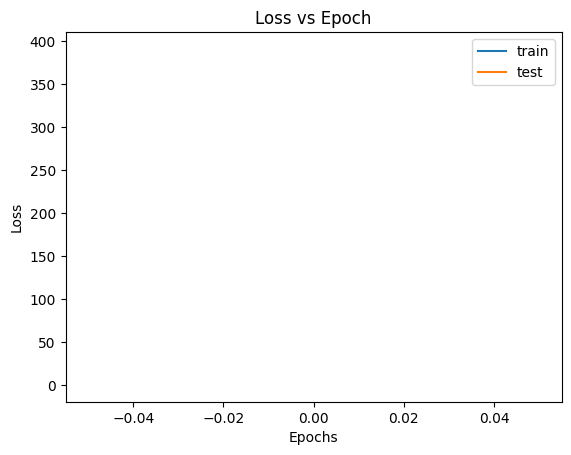

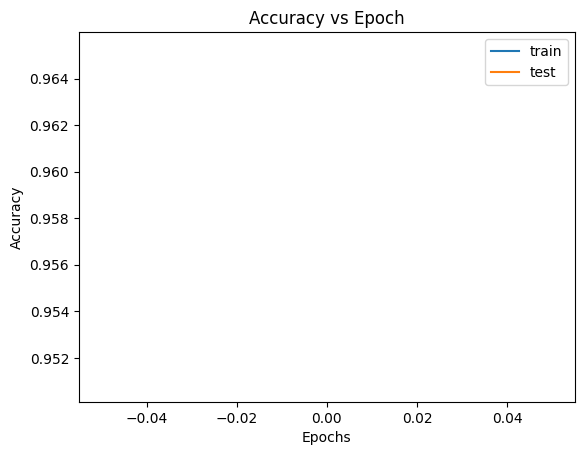

In [13]:
train_Unet()

<ipython-input-14-45cd19aef91c>:17: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  img_ex = nib.load(img_path[25]).get_data()
<ipython-input-14-45cd19aef91c>:18: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  mask_ex = nib.load(mask_path[25]).get_data()


1/1 [==============================] - 5s 5s/step


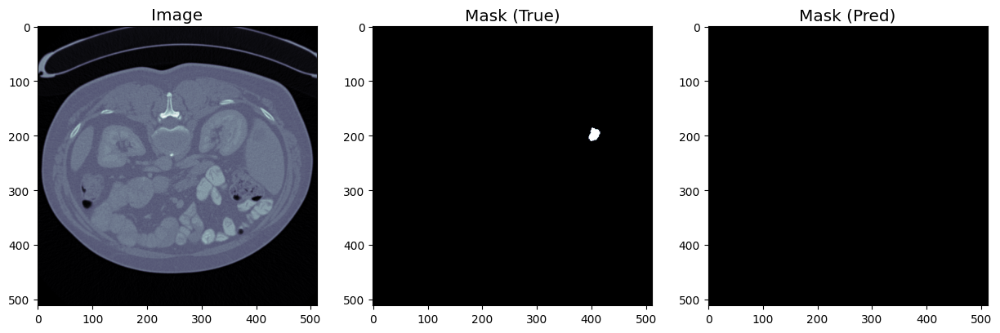

1/1 [==============================] - 3s 3s/step


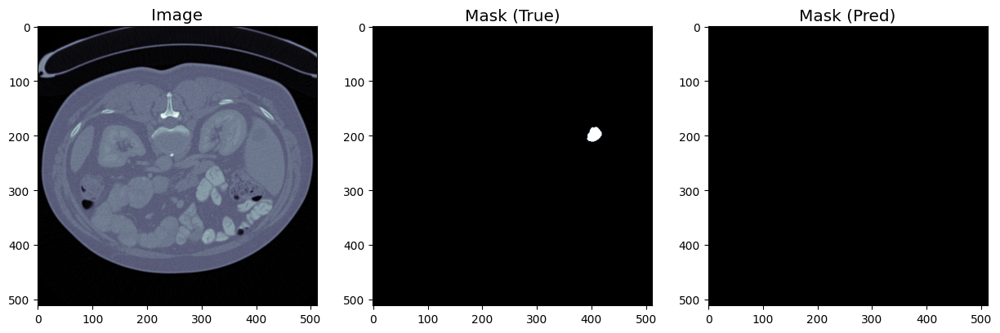

1/1 [==============================] - 3s 3s/step


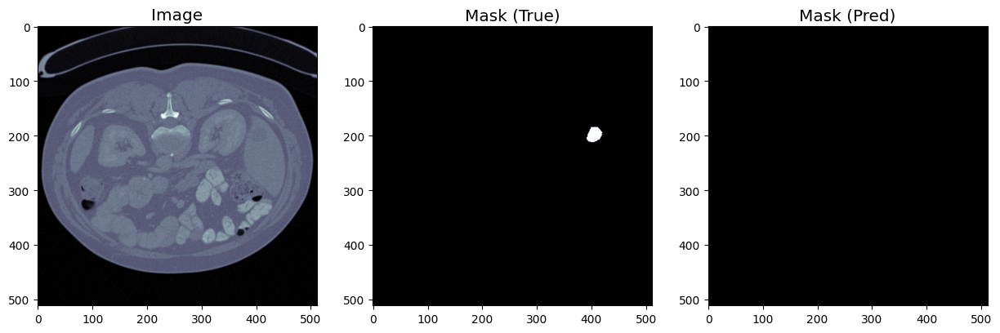

1/1 [==============================] - 5s 5s/step


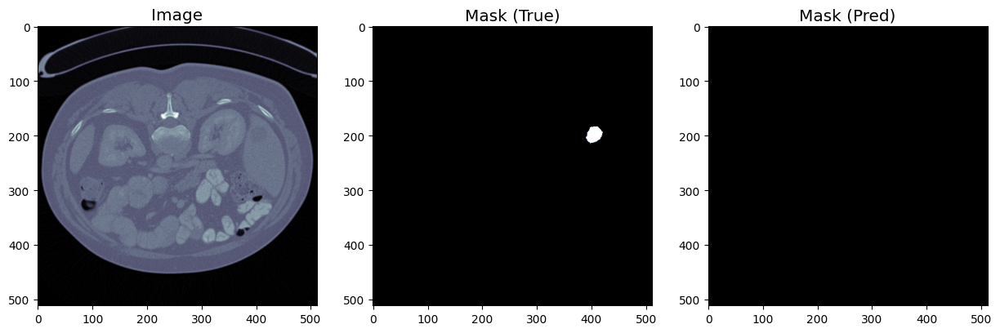

1/1 [==============================] - 3s 3s/step


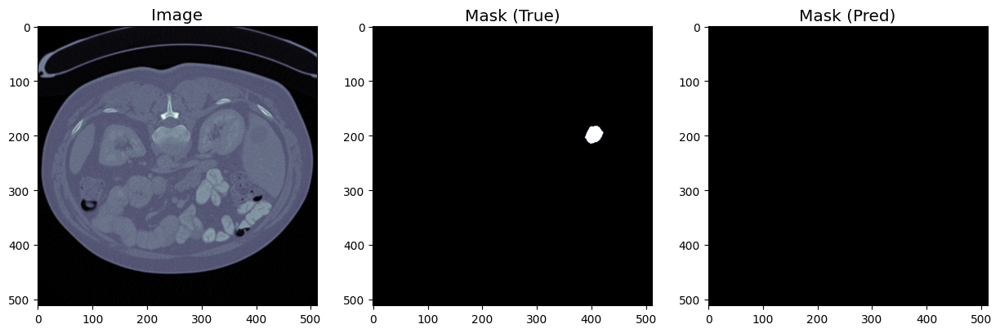

1/1 [==============================] - 4s 4s/step


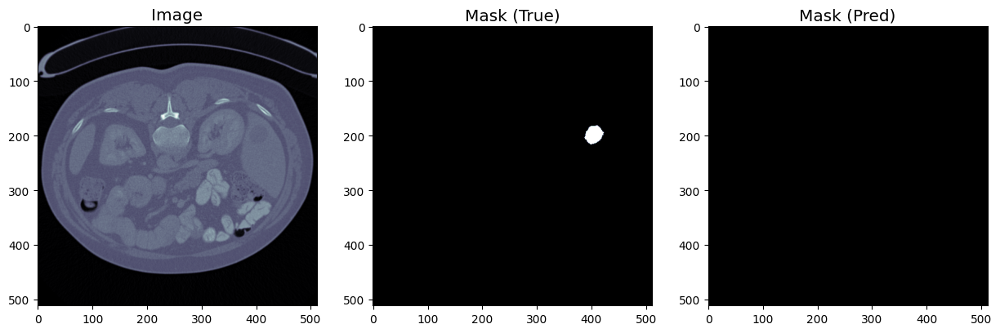

1/1 [==============================] - 5s 5s/step


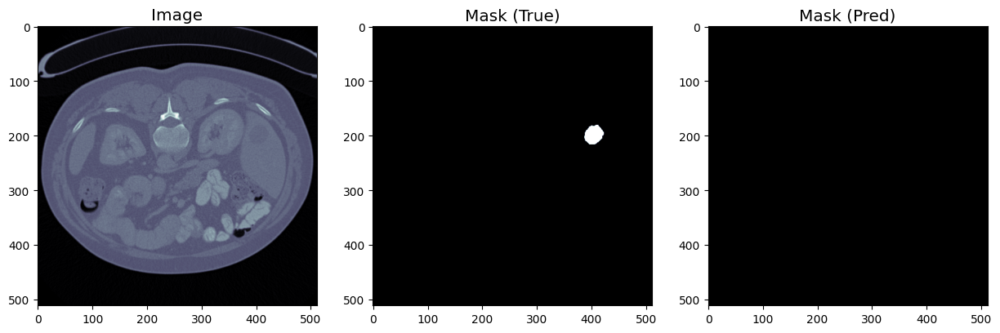

1/1 [==============================] - 3s 3s/step


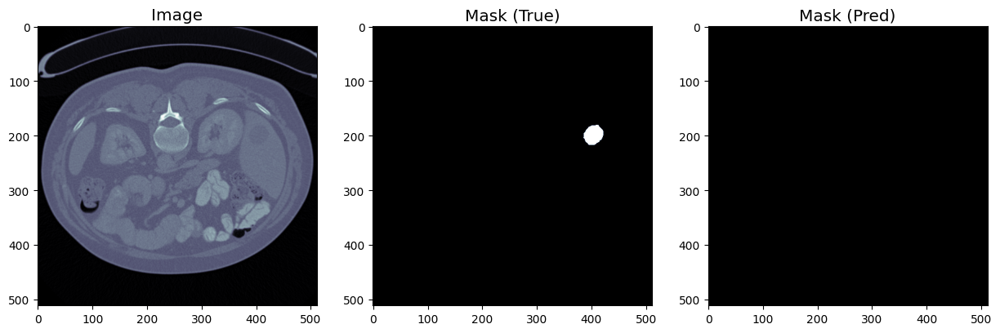

1/1 [==============================] - 3s 3s/step


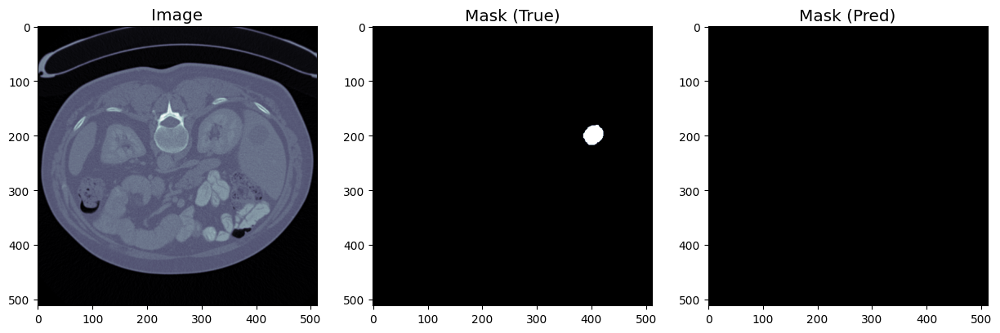

1/1 [==============================] - 4s 4s/step


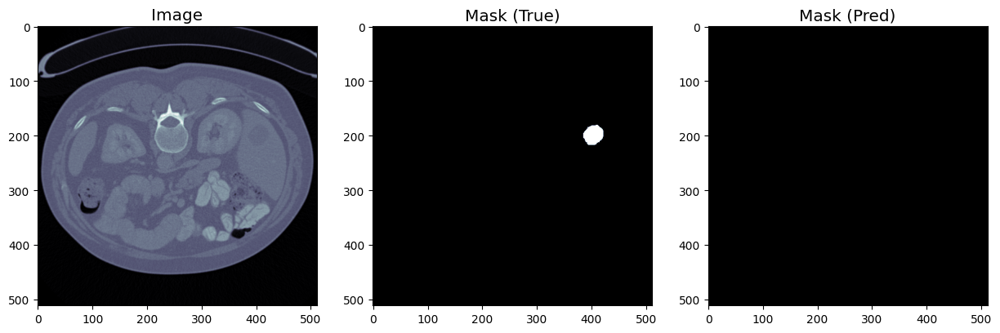

1/1 [==============================] - 3s 3s/step


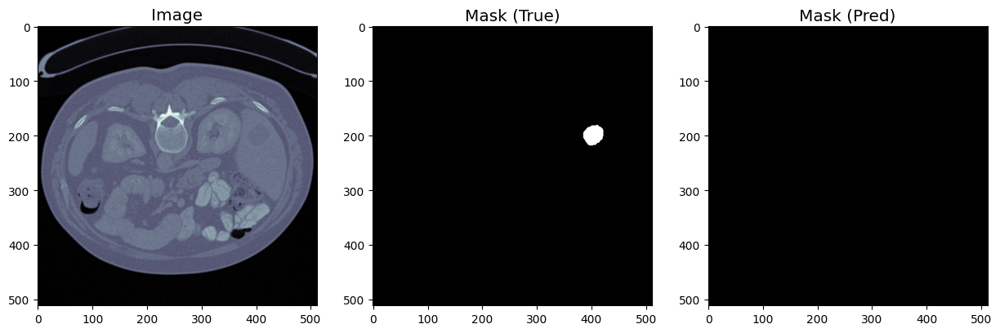

1/1 [==============================] - 3s 3s/step


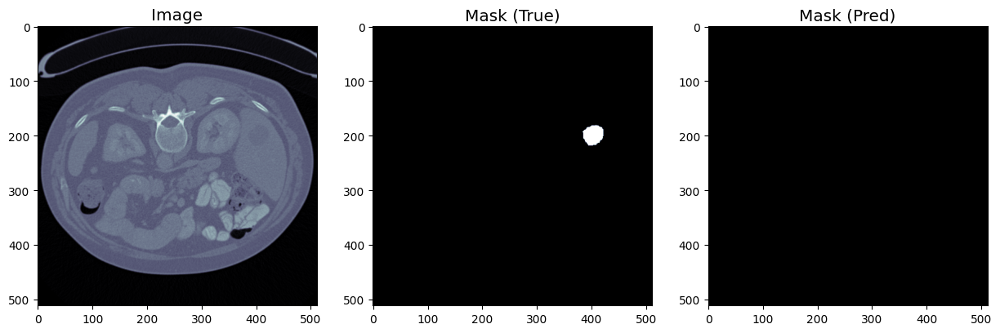

1/1 [==============================] - 5s 5s/step


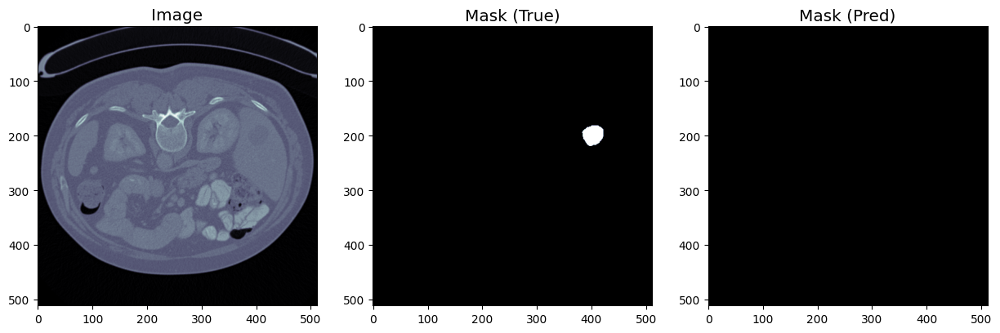

1/1 [==============================] - 3s 3s/step


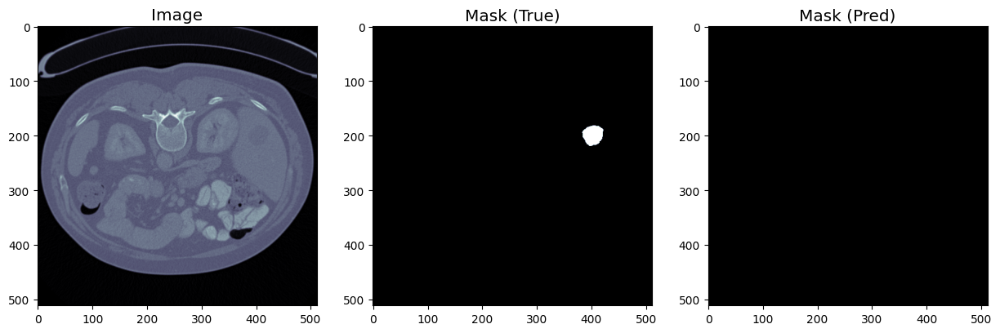

1/1 [==============================] - 3s 3s/step


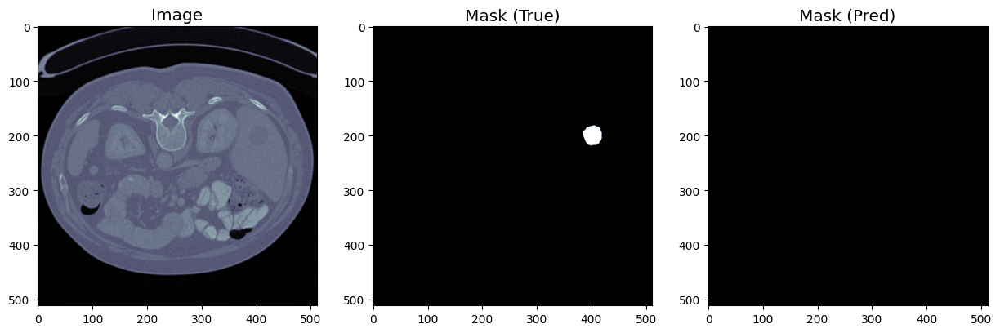

1/1 [==============================] - 4s 4s/step


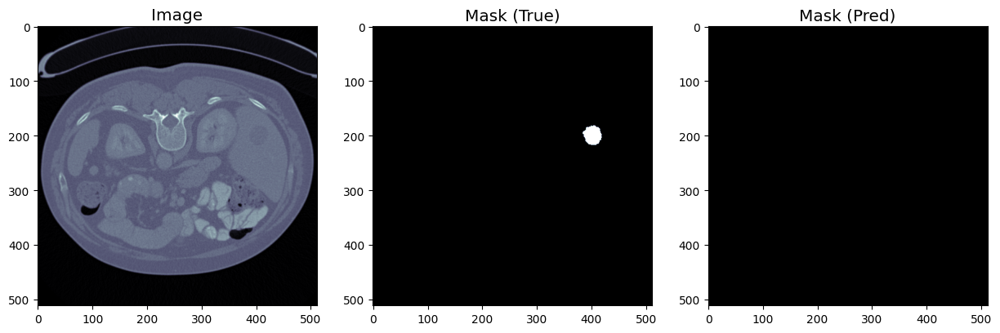

1/1 [==============================] - 4s 4s/step


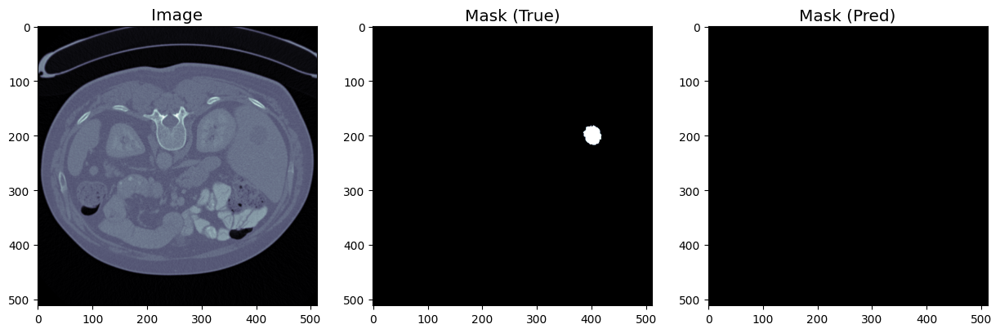

1/1 [==============================] - 3s 3s/step


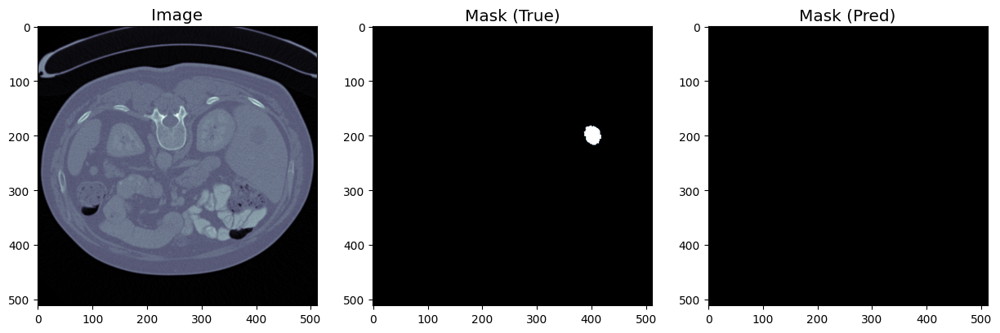

1/1 [==============================] - 3s 3s/step


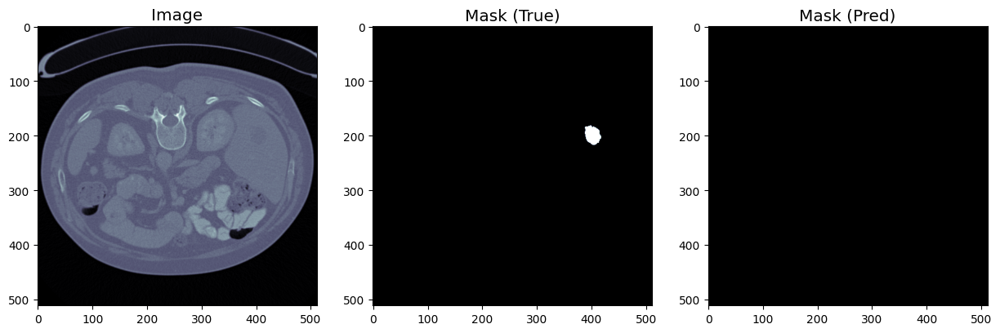

1/1 [==============================] - 4s 4s/step


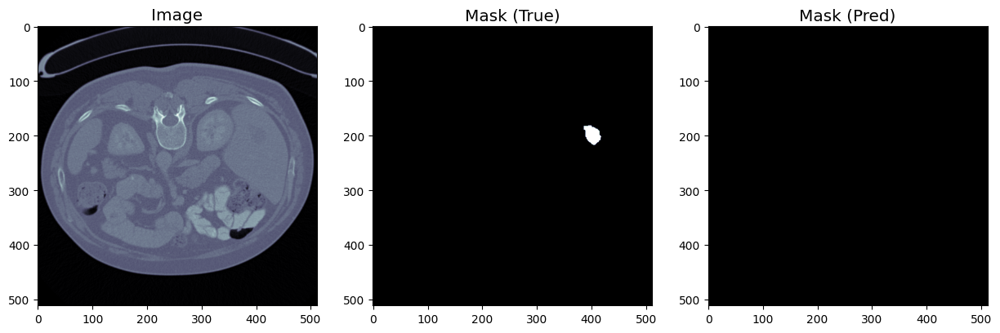

1/1 [==============================] - 3s 3s/step


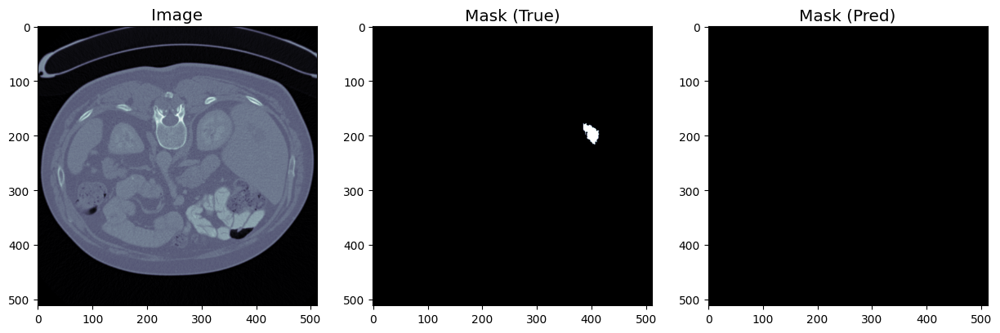

1/1 [==============================] - 3s 3s/step


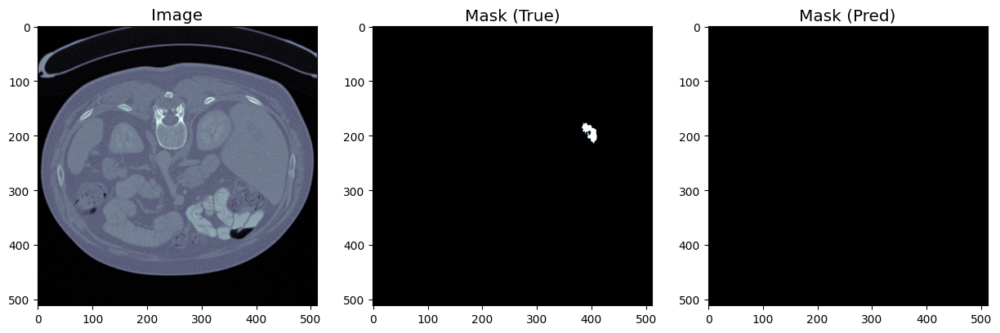

1/1 [==============================] - 4s 4s/step


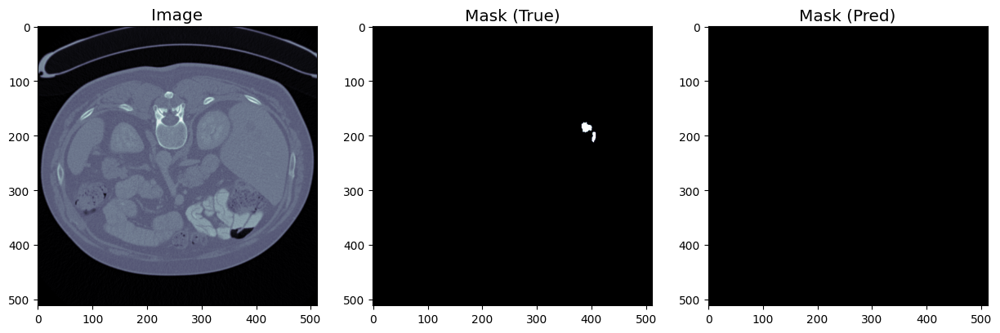

1/1 [==============================] - 3s 3s/step


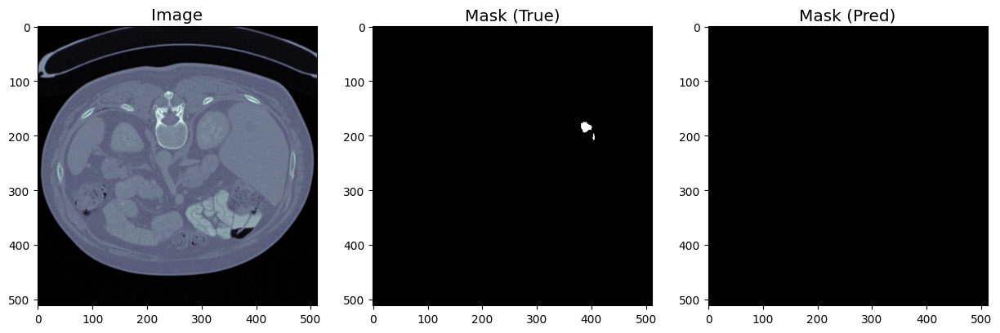

1/1 [==============================] - 3s 3s/step


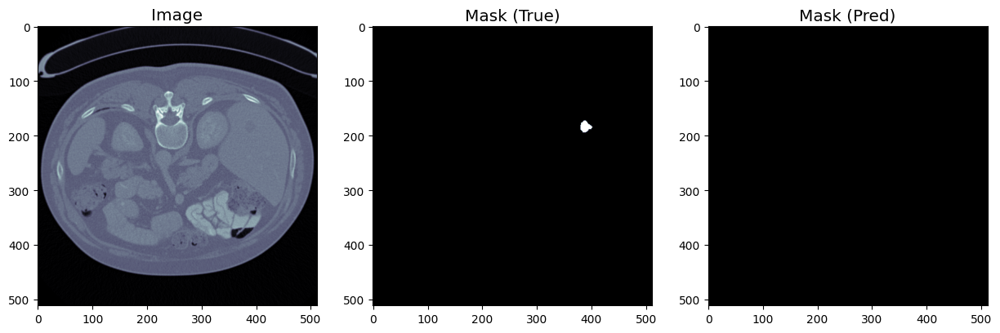

1/1 [==============================] - 4s 4s/step


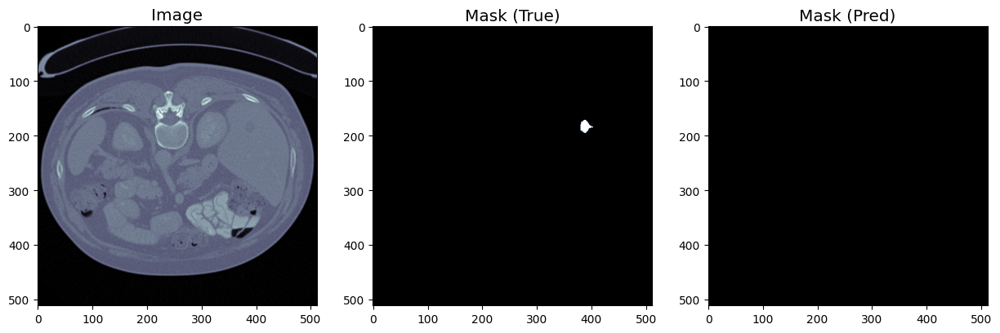

1/1 [==============================] - 4s 4s/step


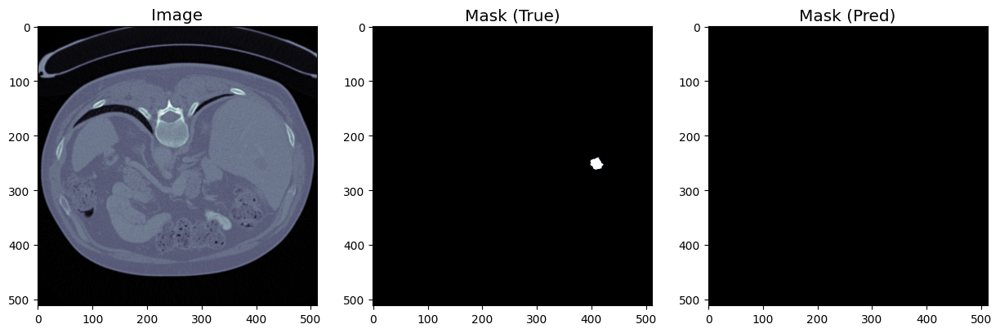

1/1 [==============================] - 3s 3s/step


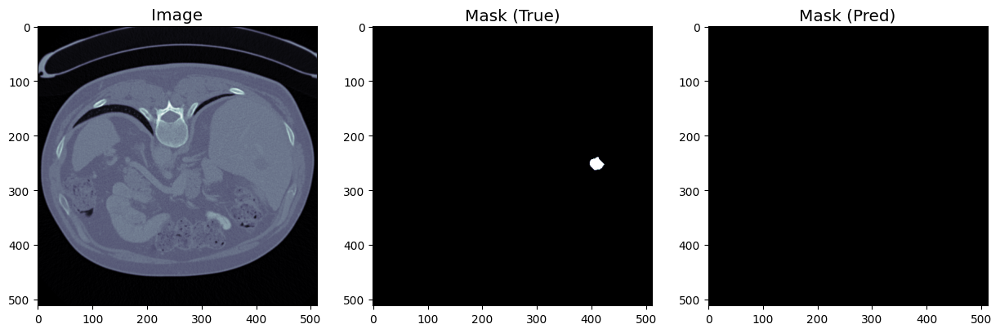

1/1 [==============================] - 3s 3s/step


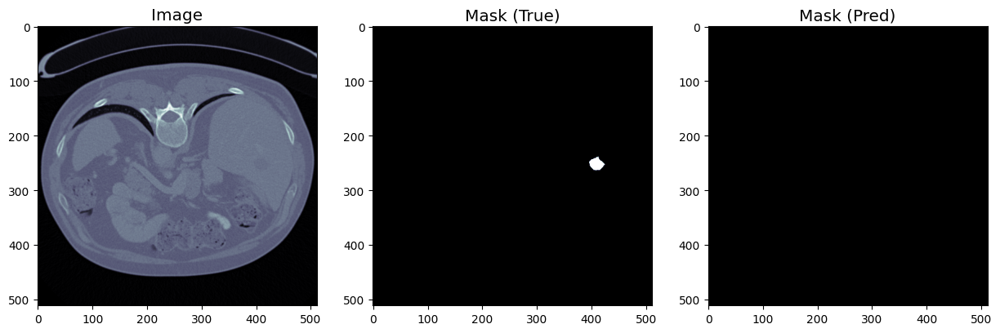

1/1 [==============================] - 5s 5s/step


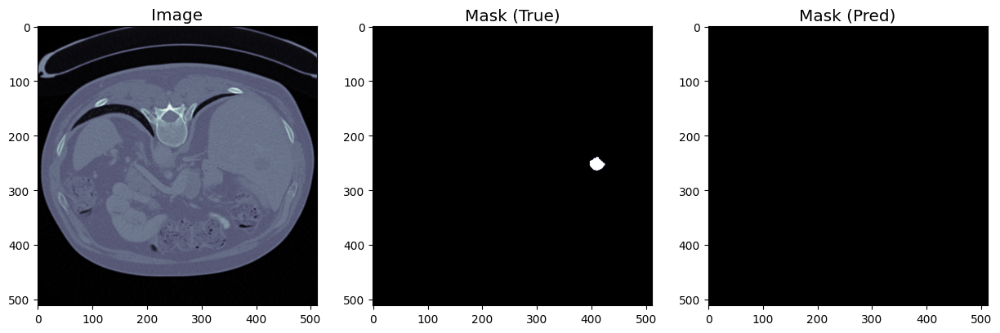

1/1 [==============================] - 3s 3s/step


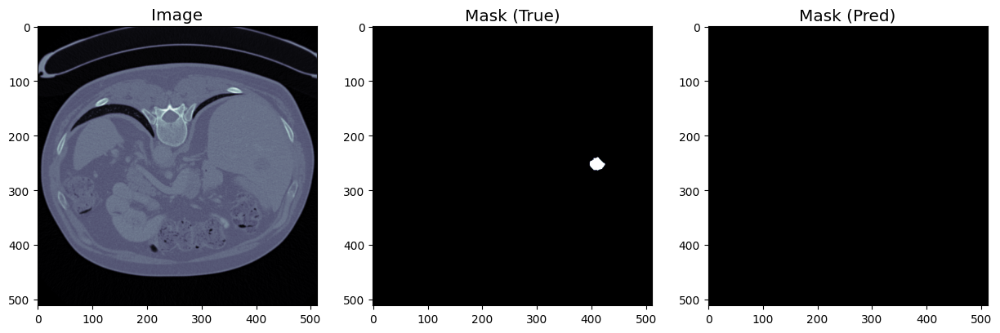

1/1 [==============================] - 3s 3s/step


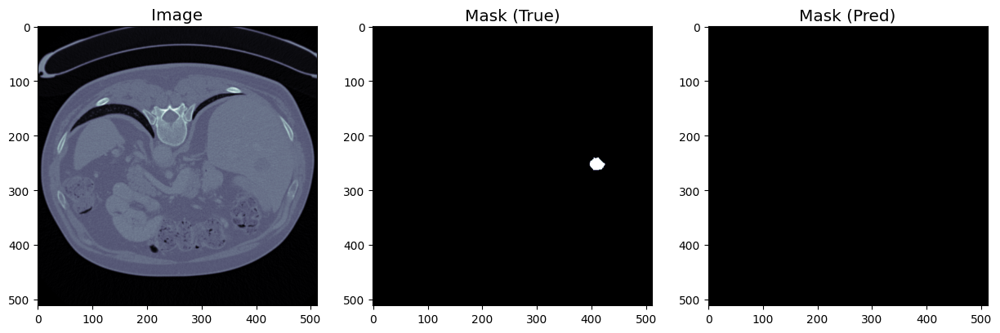

1/1 [==============================] - 4s 4s/step


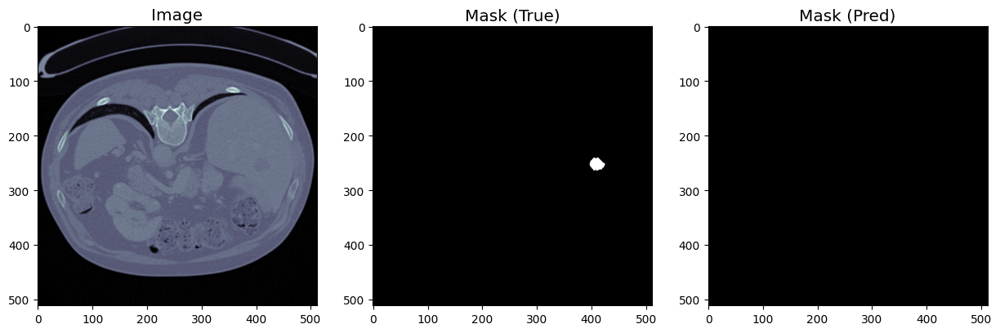

1/1 [==============================] - 3s 3s/step


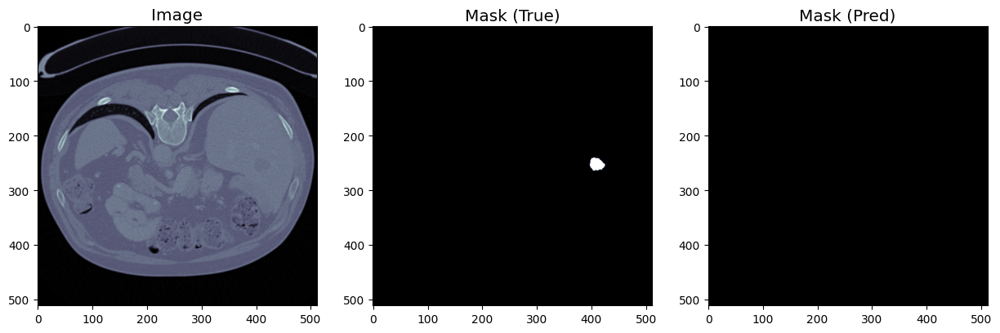

1/1 [==============================] - 3s 3s/step


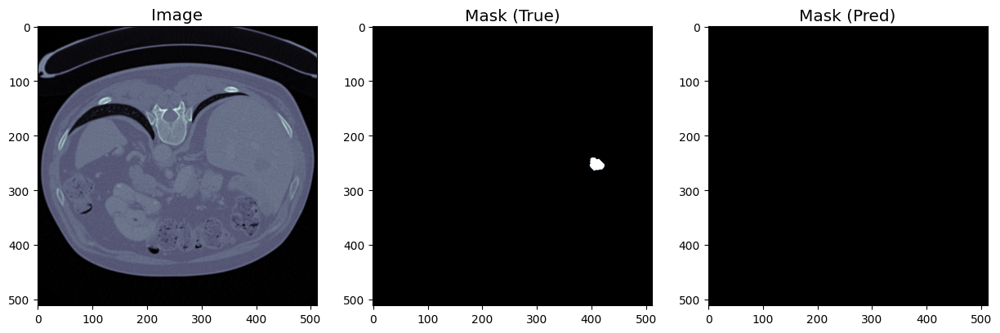

1/1 [==============================] - 4s 4s/step


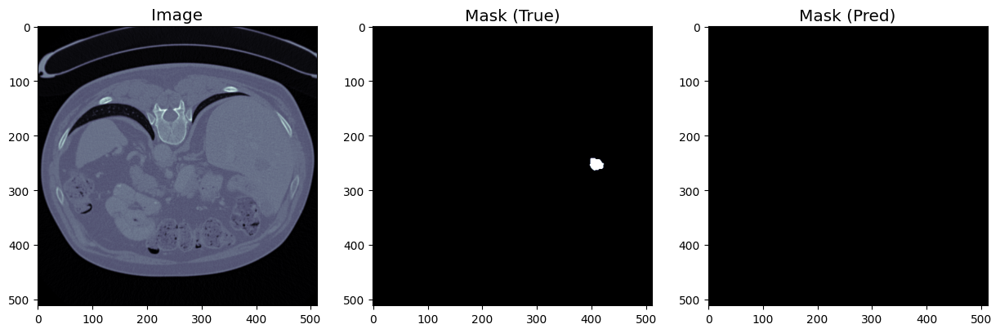

1/1 [==============================] - 4s 4s/step


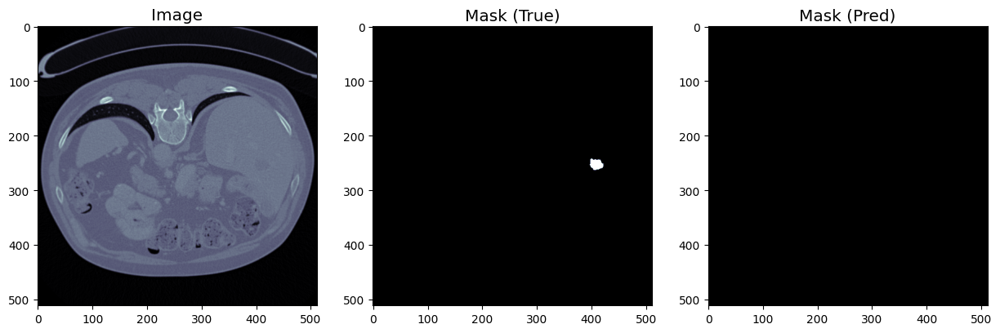

1/1 [==============================] - 3s 3s/step


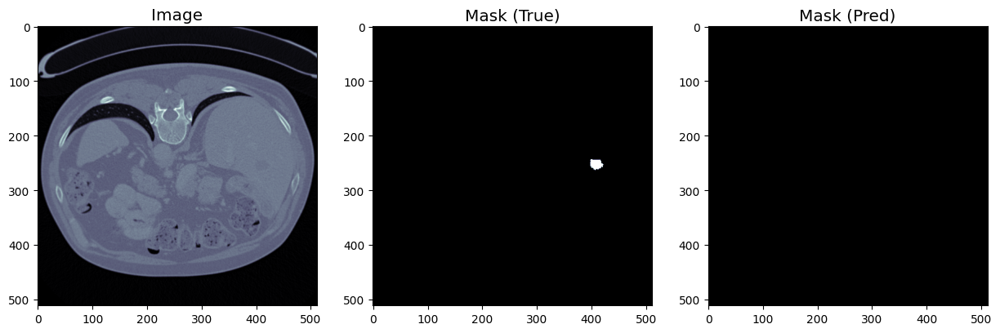

1/1 [==============================] - 3s 3s/step


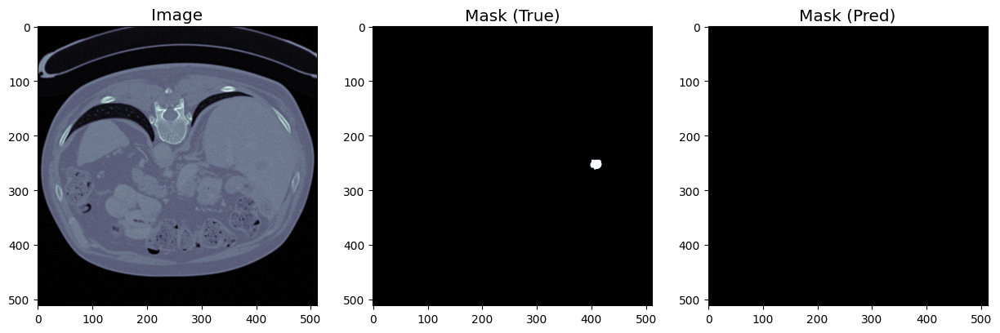

1/1 [==============================] - 4s 4s/step


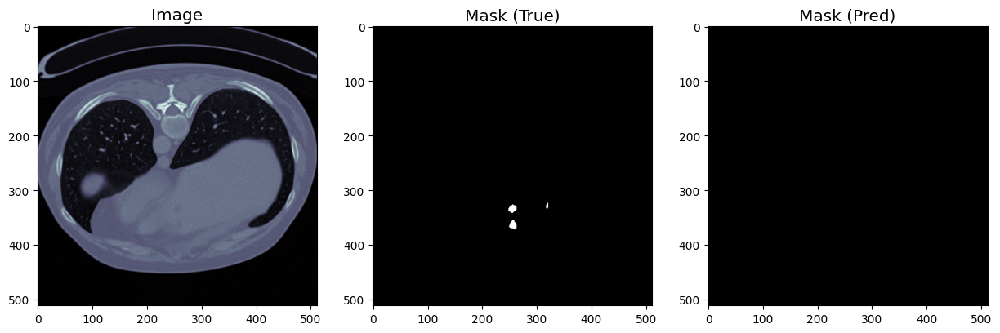

1/1 [==============================] - 3s 3s/step


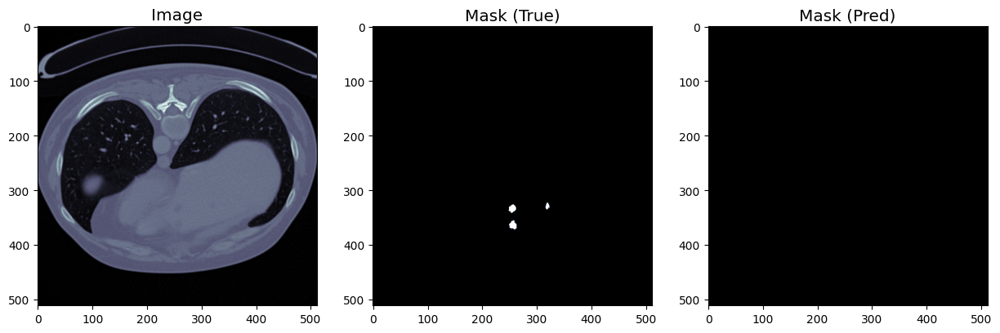

1/1 [==============================] - 3s 3s/step


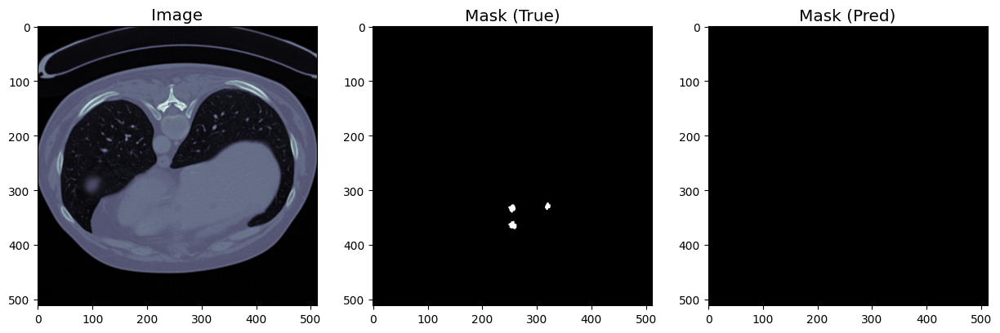

1/1 [==============================] - 5s 5s/step


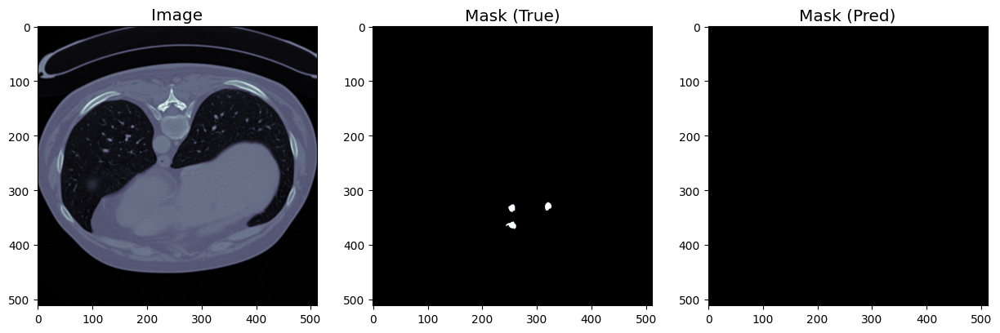

1/1 [==============================] - 3s 3s/step


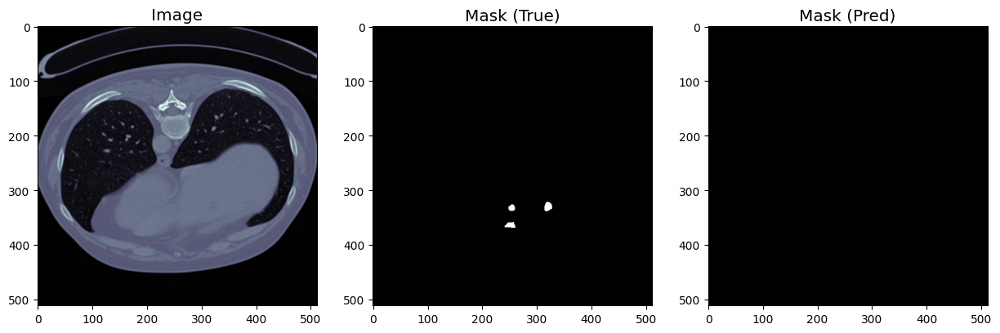

In [14]:
import keras
from keras.models import load_model
model = keras.models.Sequential()
input_shape = [64, 64, 1]

Datapath='/content/drive/My Drive/Training Batch 2'
imgdata=[]

img_path2 = sorted(glob(Datapath+"/volume-*.nii"))
mask_path2 = sorted(glob(Datapath+"/segmentation-*.nii"))


from keras.models import load_model

loaded_model = load_model("/content/UNet_Liver.hdf5", compile=False)

img_ex = nib.load(img_path[25]).get_data()
mask_ex = nib.load(mask_path[25]).get_data()

mask_ex[mask_ex == 1] = 0


for i in range(mask_ex.shape[2]):
    _, count = np.unique(mask_ex[:, :, i], return_counts=True)

    if len(count) > 1 and count[1] > 300:

        patch_ex = slice_to_patch(img_ex[:, :, i], patch_ratio)
        prediction = loaded_model.predict(patch_ex)
        prediction_mask = patch_to_slice(prediction, patch_ratio, input_shape, conf_threshold = 0.97)

        fig, (ax1,ax2,ax3) = plt.subplots(1, 3, figsize = ((15, 15)))

        ax1.imshow(np.rot90(img_ex[:, :, i], 3), cmap = 'bone')
        ax1.set_title("Image", fontsize = "x-large")
        ax1.grid(False)
        ax2.imshow(np.rot90(mask_ex[:, :, i], 3), cmap = 'bone')
        ax2.set_title("Mask (True)", fontsize = "x-large")
        ax2.grid(False)
        ax3.imshow(np.rot90(prediction_mask.reshape((512, 512)), 3), cmap = 'bone')
        ax3.set_title("Mask (Pred)", fontsize = "x-large")
        ax3.grid(False)

        plt.show()